# Evaluation Project 3-2 Rainfall Weather Forecasting

# BY: Aakash bindal

# BATCH NO:DS2401

# Project Description
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 

a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:
Number of columns: 23


Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


In [1]:
#importing the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(color_codes=True)

import warnings 
warnings.filterwarnings('ignore')

In [2]:
rf = pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Rainfall%20Forecast/Rainfall.csv")
rf

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
# Checking the shape of the dataset-
print("Number of rows in the given dataset:",rf.shape[0])
print("Number of columns in the given dataset:",rf.shape[1])

Number of rows in the given dataset: 8425
Number of columns in the given dataset: 23


# Exploratory Data Analysis¶

In [4]:
# checking the datatypes of all the columns 
rf.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [5]:
# Checking the information present in dataset
rf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

 Only the columns 'Date' and 'Location' are having 8425 non null values. The column 'Date' is identified as string object. 

In [6]:
# Checking the nunique values in each columns-
rf.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

In [7]:
# checking the value count of each columns -
for i in rf.columns:
    print('--' * 20 + i + '--' * 20)
    display(rf[i].value_counts().head())

----------------------------------------Date----------------------------------------


2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
Name: Date, dtype: int64

----------------------------------------Location----------------------------------------


Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
Name: Location, dtype: int64

----------------------------------------MinTemp----------------------------------------


12.0    74
13.2    71
13.8    69
12.7    68
16.4    67
Name: MinTemp, dtype: int64

----------------------------------------MaxTemp----------------------------------------


19.0    87
23.8    75
19.8    74
25.0    71
22.0    68
Name: MaxTemp, dtype: int64

----------------------------------------Rainfall----------------------------------------


0.0    5299
0.2     406
0.4     177
0.6     116
1.2      86
Name: Rainfall, dtype: int64

----------------------------------------Evaporation----------------------------------------


4.0    180
3.0    163
2.4    147
2.2    146
2.6    143
Name: Evaporation, dtype: int64

----------------------------------------Sunshine----------------------------------------


0.0     166
11.1     68
11.2     67
11.0     66
10.7     64
Name: Sunshine, dtype: int64

----------------------------------------WindGustDir----------------------------------------


N      713
SSE    578
S      577
SW     572
E      557
Name: WindGustDir, dtype: int64

----------------------------------------WindGustSpeed----------------------------------------


39.0    441
35.0    435
37.0    422
33.0    408
31.0    396
Name: WindGustSpeed, dtype: int64

----------------------------------------WindDir9am----------------------------------------


N      906
SW     704
NW     625
WSW    543
SE     505
Name: WindDir9am, dtype: int64

----------------------------------------WindDir3pm----------------------------------------


SE     813
S      742
SSE    623
WSW    580
NE     544
Name: WindDir3pm, dtype: int64

----------------------------------------WindSpeed9am----------------------------------------


9.0     803
0.0     752
13.0    708
4.0     610
11.0    607
Name: WindSpeed9am, dtype: int64

----------------------------------------WindSpeed3pm----------------------------------------


9.0     724
19.0    639
13.0    599
20.0    594
17.0    555
Name: WindSpeed3pm, dtype: int64

----------------------------------------Humidity9am----------------------------------------


73.0    205
62.0    202
68.0    199
74.0    195
70.0    188
Name: Humidity9am, dtype: int64

----------------------------------------Humidity3pm----------------------------------------


55.0    195
48.0    194
51.0    194
46.0    193
54.0    193
Name: Humidity3pm, dtype: int64

----------------------------------------Pressure9am----------------------------------------


1014.8    58
1019.2    55
1016.1    54
1019.6    53
1020.0    49
Name: Pressure9am, dtype: int64

----------------------------------------Pressure3pm----------------------------------------


1017.8    60
1018.0    57
1019.8    53
1017.9    53
1015.5    52
Name: Pressure3pm, dtype: int64

----------------------------------------Cloud9am----------------------------------------


7.0    1418
1.0    1038
8.0    1015
0.0     554
6.0     551
Name: Cloud9am, dtype: int64

----------------------------------------Cloud3pm----------------------------------------


7.0    1294
1.0    1077
8.0     863
6.0     597
5.0     522
Name: Cloud3pm, dtype: int64

----------------------------------------Temp9am----------------------------------------


14.8    77
18.0    73
18.3    71
17.5    69
20.6    68
Name: Temp9am, dtype: int64

----------------------------------------Temp3pm----------------------------------------


19.2    78
22.5    77
19.0    75
21.7    72
18.5    72
Name: Temp3pm, dtype: int64

----------------------------------------RainToday----------------------------------------


No     6195
Yes    1990
Name: RainToday, dtype: int64

----------------------------------------RainTomorrow----------------------------------------


No     6195
Yes    1991
Name: RainTomorrow, dtype: int64

In [8]:
rf['Date'] = pd.to_datetime(rf['Date'], format = "%Y-%m-%d")
rf['Day'] = rf['Date'].dt.day
rf['Month'] = rf['Date'].dt.month
rf['Year'] = rf['Date'].dt.year

In [9]:
#We can drop the column 'Date' as we have created new separete columns with day, month, year of the observations.

rf.drop('Date',axis = 1, inplace = True)

#We can drop the column 'Date' as we have created new separete columns with day, month, year of the observations.


# Checking Null and Duplicates Values

In [10]:
print(rf.isnull().sum())

Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
Day                 0
Month               0
Year                0
dtype: int64


<Axes: >

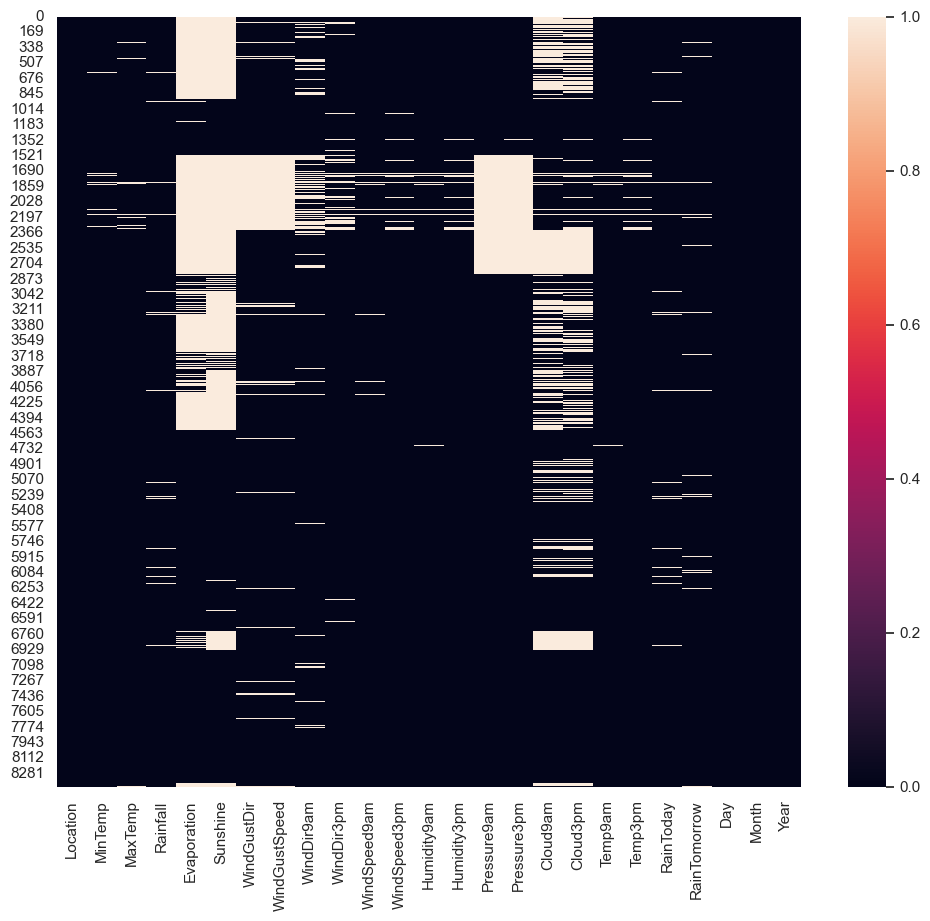

In [11]:
plt.figure(figsize=[12,10])
sns.heatmap(rf.isnull())



There are missing values in the dataset

# Complete the missing values and again check null values.


In [12]:
numerical_col =[]
categorical_col = []
for i in rf.columns:
    if rf[i].dtypes == 'object':
        rf[i].fillna(rf[i].mode()[0],inplace = True)   
        categorical_col.append(i)
    elif rf[i].dtypes == 'float64':
        rf[i].fillna(np.mean(rf[i]),inplace = True)
        numerical_col.append(i)

In [13]:
numerical_col

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [14]:
categorical_col

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [15]:
rf.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Day              0
Month            0
Year             0
dtype: int64

After filling in the null values, there are no longer any null values present in the dataset.

In [16]:
rf.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934,15.741958,6.442136,2012.102433
std,5.379488,6.114516,10.309308,3.852004,2.825451,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849,8.787354,3.437994,2.473137
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,8.000000,3.000000,2010.000000
50%,13.200000,23.300000,0.000000,5.389395,7.632205,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000,16.000000,6.000000,2011.000000
75%,17.300000,28.000000,1.400000,5.389395,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,23.000000,9.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,31.000000,12.000000,2017.000000



Average maximum temperature recorded was 23.85 degrees Celsius, with a minimum of 13.19 degrees Celsius. The mean minimum temperature was 13.14 degrees Celsius. The maximum rainfall observed in a single day was 371 mm. The maximum number of hours of bright sunshine in a day was 13.9 hours. Most columns show similar mean and median values, indicating low skewness. However, there is a significant difference between the 75th percentile and the maximum value, suggesting the presence of outliers.

# Data Visualisation

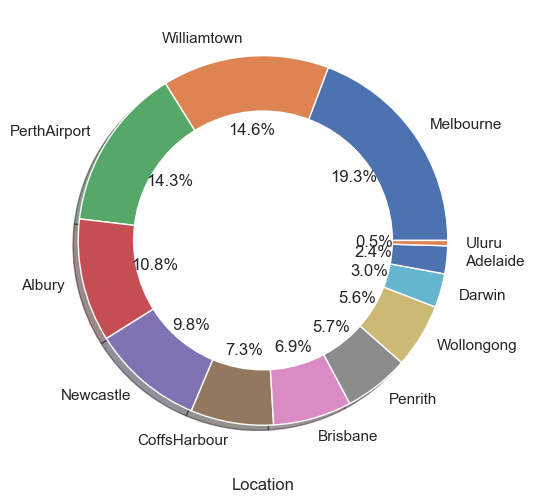

<Figure size 640x480 with 0 Axes>

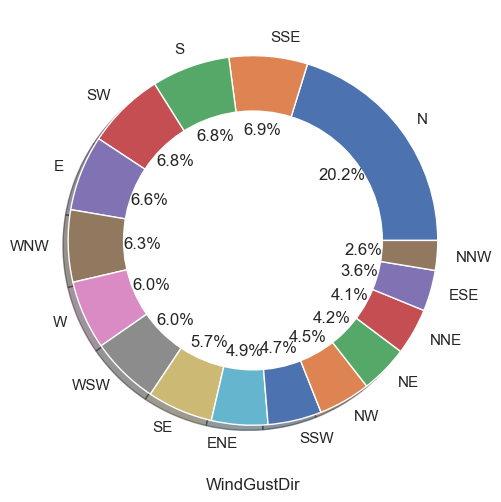

<Figure size 640x480 with 0 Axes>

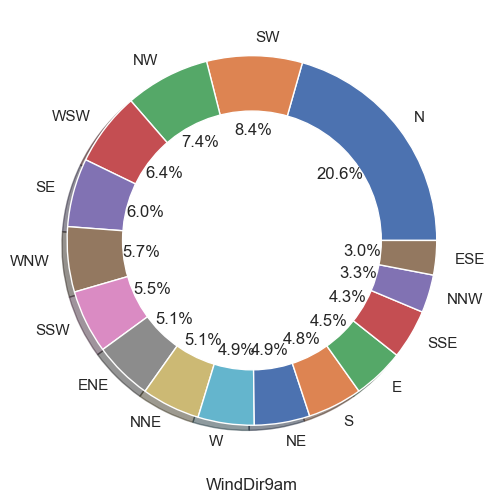

<Figure size 640x480 with 0 Axes>

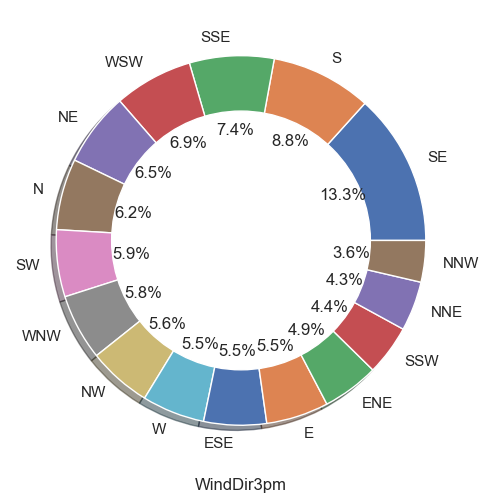

<Figure size 640x480 with 0 Axes>

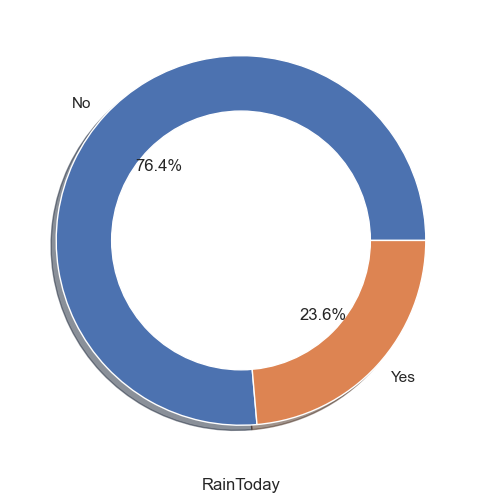

<Figure size 640x480 with 0 Axes>

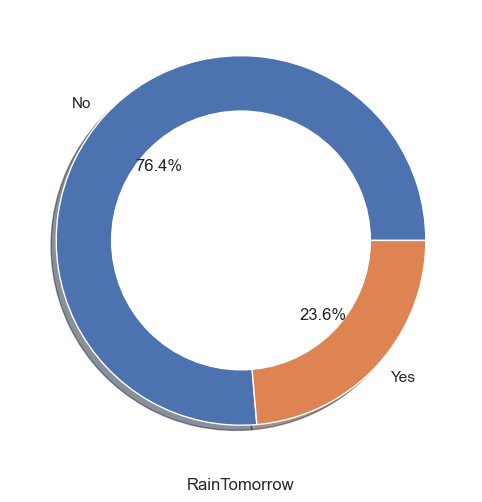

<Figure size 640x480 with 0 Axes>

In [17]:
for i in categorical_col:
    plt.figure(figsize=(8,6))
    rf[i].value_counts().plot.pie(autopct='%1.1f%%',shadow=True)
    centre=plt.Circle((0,0),0.7,fc='white')
    fig=plt.gcf()
    fig.gca().add_artist(centre)
    plt.xlabel(i)
    plt.ylabel('')
    plt.figure()

Most areas recieve strongest windgust from north direction.
Most rainfall areas are from North at 09.00 AM.
Most rainfall areas are from South East at 03.00 PM.

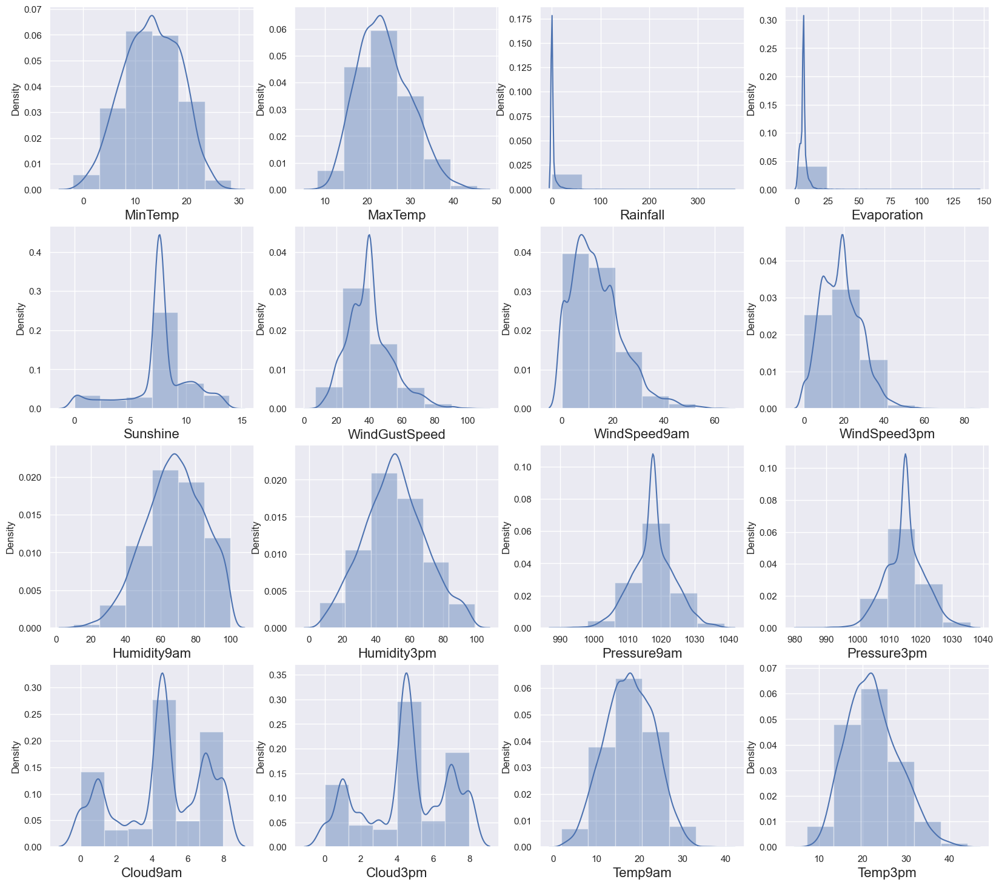

In [18]:
plotnumber = 1
plt.figure(figsize=(20,18))

for i in numerical_col:
    if plotnumber<=16:
        ax = plt.subplot(4,4,plotnumber)
        sns.distplot(rf[i],bins =6,kde=True)
        plt.xlabel(i,fontsize=16)
        plotnumber+=1
plt.show()

Certainly! Here's a concise version:

Minimum temperatures typically range from 8 to 18°C, while maximum temperatures are predominantly between 14.4 to 33°C. Daily rainfall varies from 0 to 61 mm. Most areas experience Class-A evaporation rates of 0 to 20 mm by 09:00 AM, receive sunlight for 6.95 to 9.2 hours daily, and encounter wind gusts of 23 to 57 km/h by midnight. Humidity levels are generally 55-85% at 09:00 AM and 37-68% at 03:00 PM. Atmospheric pressure ranges from 1014 to 1022 hPa at 09:00 AM and 1009 to 1018 hPa at 03:00 PM. Cloud cover obscures the sky between 4-5.33 and 6.7-8 at both times. Temperatures range from 14 to 26.9°C at 09:00 AM and 13.4 to 27°C at 03:00 PM.

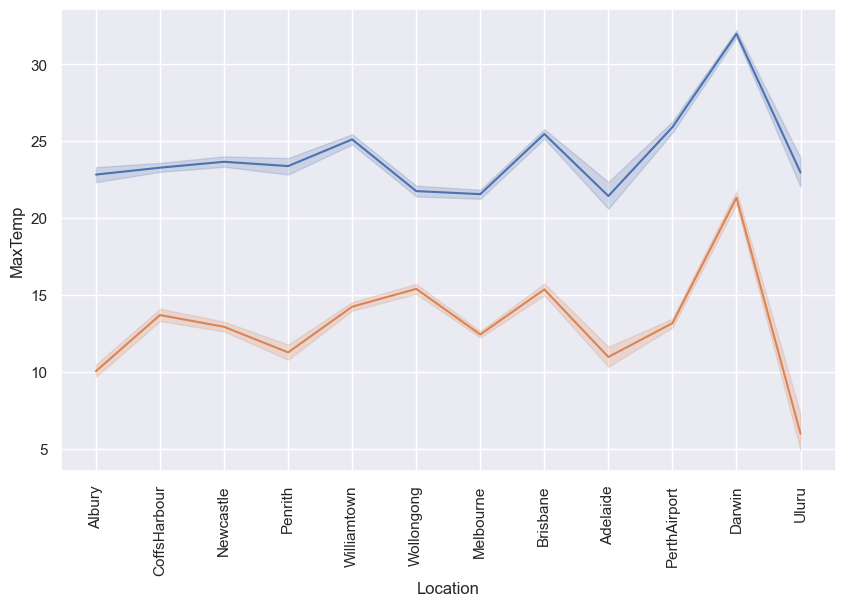

In [19]:
temp = ['MaxTemp','MinTemp']
plt.figure(figsize =[10,6])
for i in temp:
    sns.lineplot(x='Location',y =rf[i], data = rf)
    plt.xticks(rotation = 90)
plt.show()

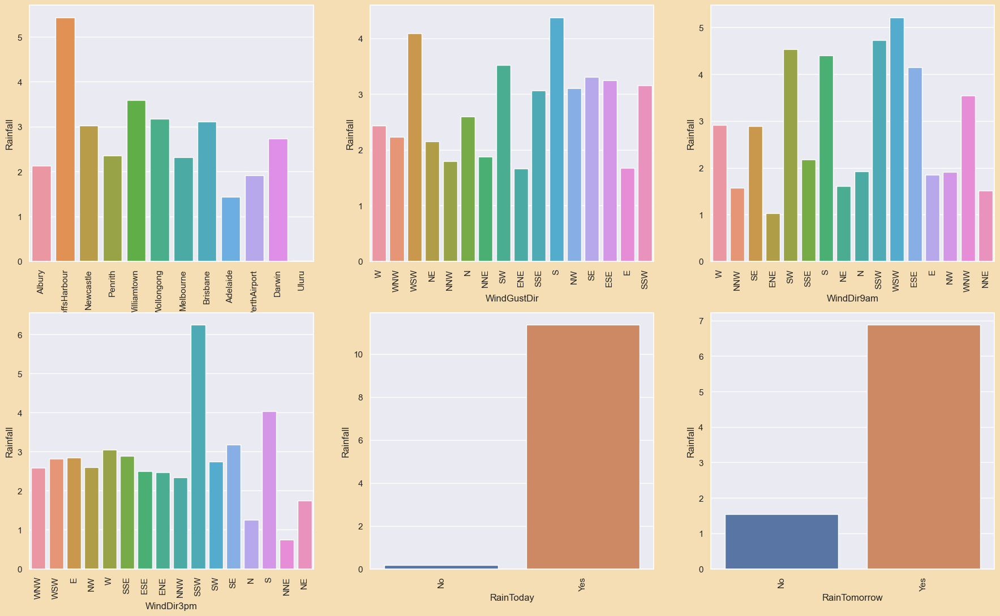

In [20]:
sns.set_style('darkgrid')
sns.set(font_scale=1)
plt.figure(facecolor='wheat',figsize=(22,20))
p=1
for i in categorical_col:
    if p<=9:
        ax=plt.subplot(3,3,p)
        sns.barplot(x=rf[i],y='Rainfall',data=rf,errorbar=None)
        plt.xticks(rotation=90)
    p+=1

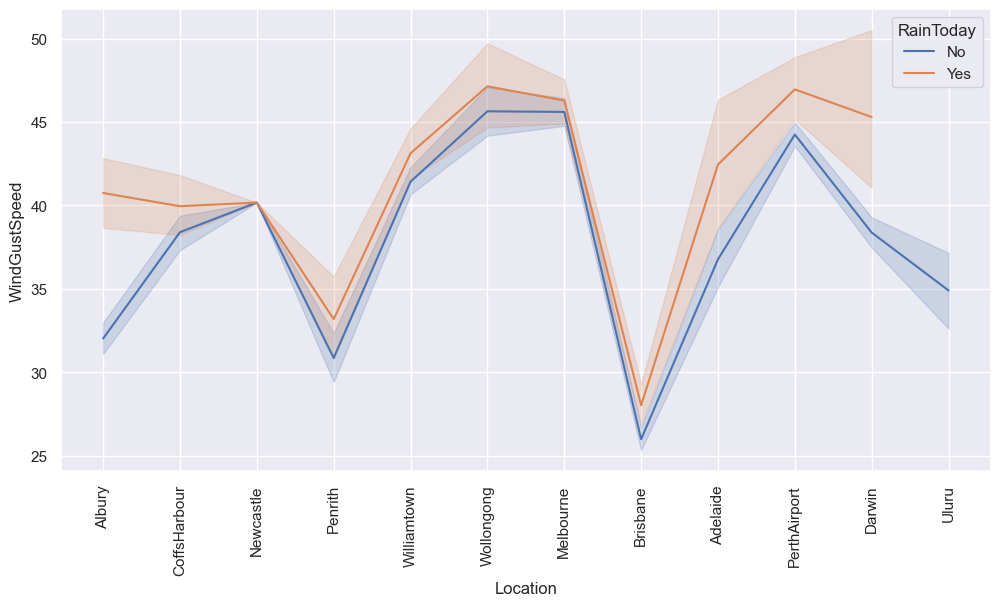

In [21]:
plt.figure(figsize =[12,6])
sns.lineplot(x='Location', y='WindGustSpeed',data = rf, hue = 'RainToday')
plt.xticks(rotation = 90)
plt.show()

<Axes: xlabel='MaxTemp', ylabel='MinTemp'>

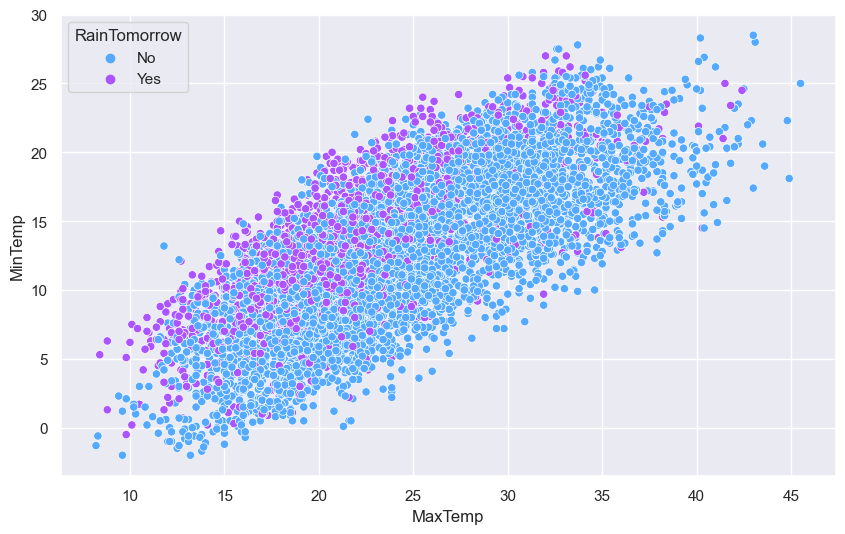

In [22]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='MaxTemp',y='MinTemp',hue='RainTomorrow',palette='cool',data=rf)

As the Min temp is increasing Max Temp is also increasing, it is a linear relationship .


<Axes: xlabel='Humidity9am', ylabel='Temp9am'>

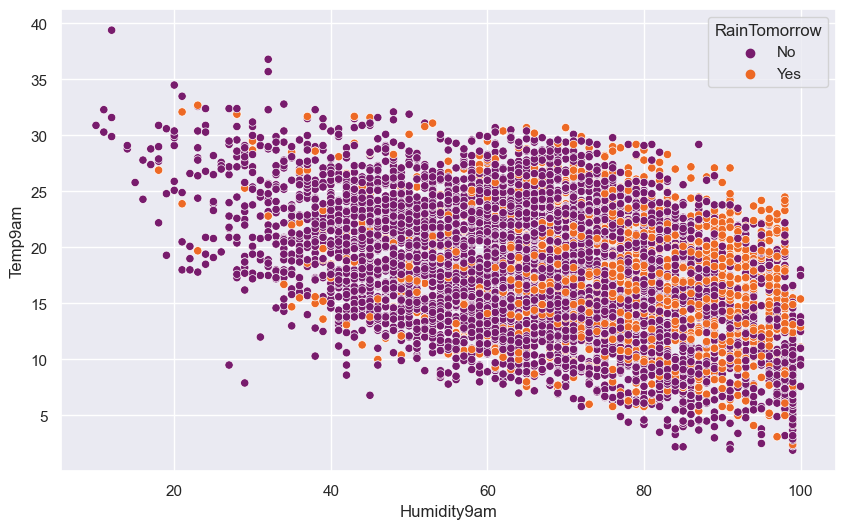

In [23]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='Humidity9am',y='Temp9am',hue='RainTomorrow',palette='inferno',data=rf)
     

Linear relationship is seen between temperature and humidity

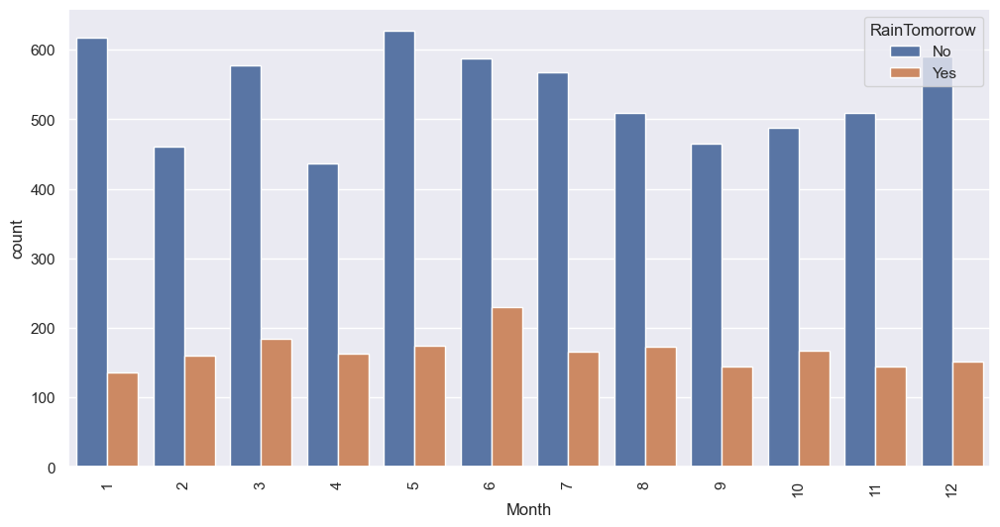

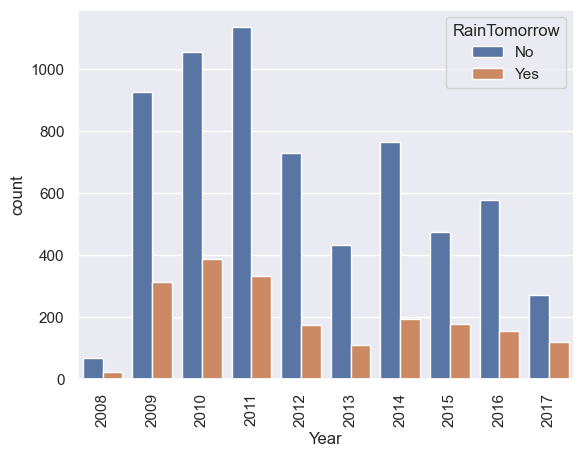

In [24]:
duration= ['Month','Year']
plt.figure(figsize =[12,6])
for i in duration:
    sns.countplot(x=rf[i], hue = rf['RainTomorrow'])
    plt.xticks(rotation = 90)
    plt.show()

most of the rainfall for next day of observation occured during the month of June.

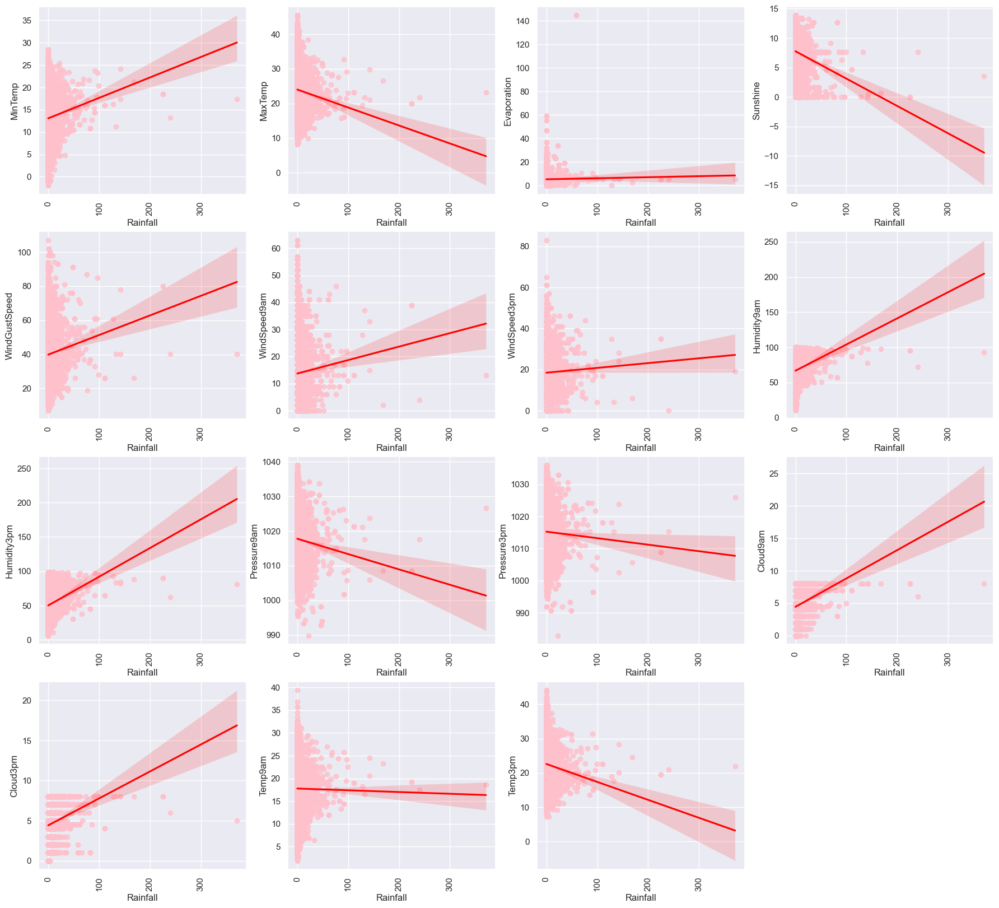

In [25]:
plt.figure(figsize=(22,20))
p=1
for i in numerical_col:
    if p<=16:
        if i=='Rainfall':
            continue
        ax=plt.subplot(4,4,p)
        sns.regplot(y=rf[i],x='Rainfall',color='pink',data=rf,line_kws=dict(color='red'))
        plt.xticks(rotation=90)
    p+=1

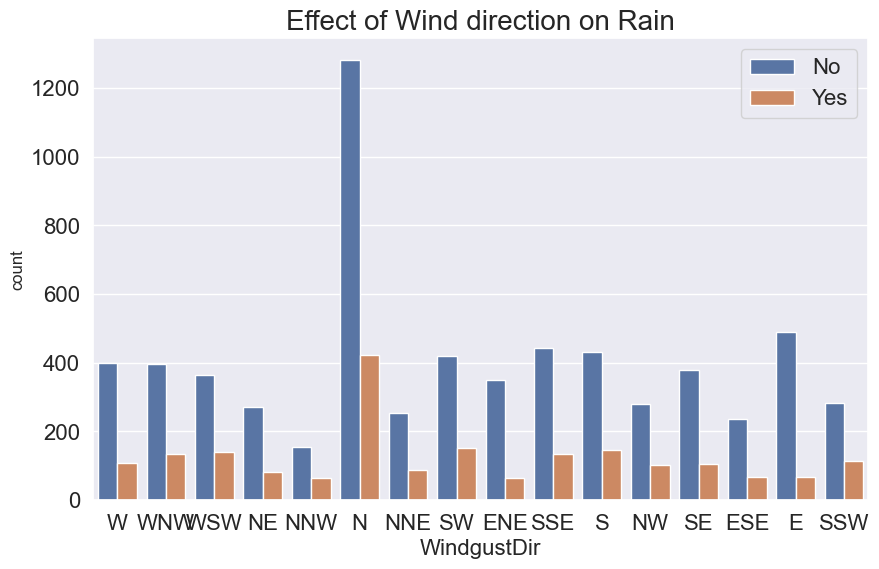

In [26]:
plt.figure(figsize=(10,6))
p = sns.countplot(x=rf['WindGustDir'], hue=rf['RainTomorrow'])
plt.title('Effect of Wind direction on Rain', fontsize=20)
p.set_xlabel('WindgustDir',fontsize=16)
plt.xticks(fontsize=16,rotation=0)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.show()

Maximum rainfall can be seen in the areas where the direction of strongest wind gust is in North direction in a day

<Axes: xlabel='MinTemp', ylabel='MaxTemp'>

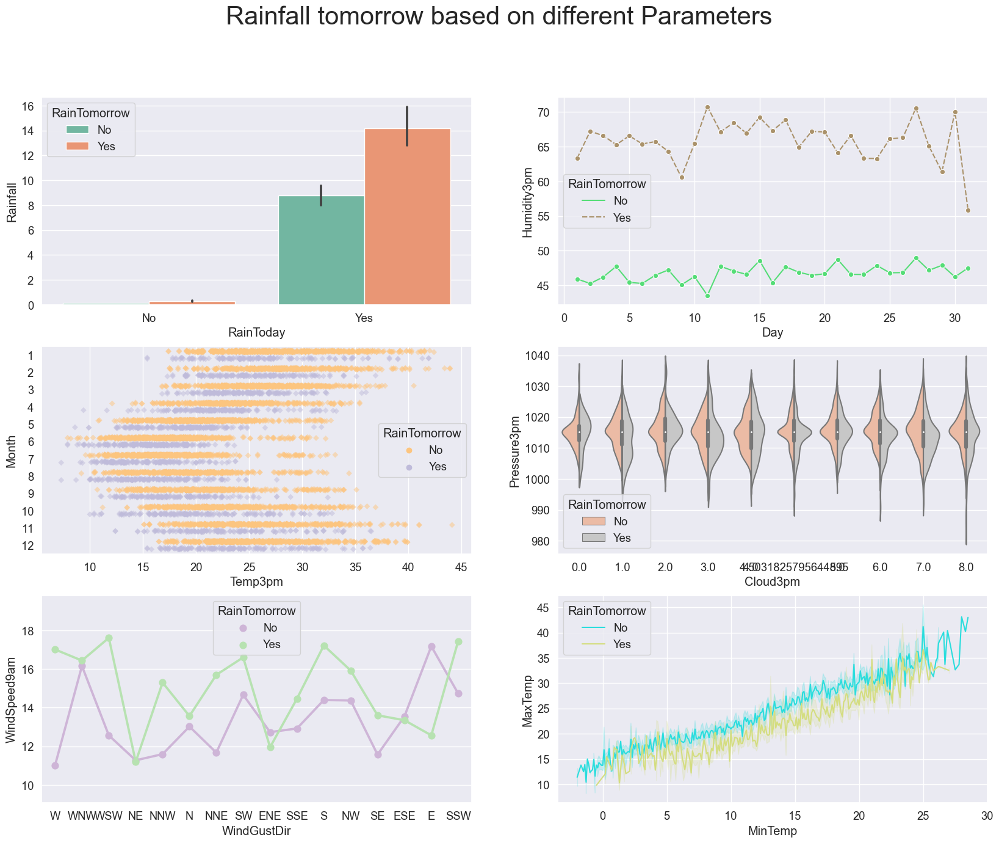

In [27]:
sns.set(font_scale=1.2)
fig,axes = plt.subplots(3, 2, figsize=(20,15))
fig.suptitle('Rainfall tomorrow based on different Parameters',fontsize=30) 
sns.barplot(ax=axes[0, 0],x='RainToday',y='Rainfall',hue='RainTomorrow',data=rf,palette="Set2") 
sns.lineplot(ax=axes[0, 1],x='Day',y='Humidity3pm',hue='RainTomorrow',style='RainTomorrow',marker='o',errorbar=None,data=rf,palette="terrain")
sns.stripplot(ax=axes[1, 0],y='Month',x='Temp3pm',hue='RainTomorrow',data=rf,palette="PuOr",orient='h',marker='D',alpha=.5,dodge=True)
sns.violinplot(ax=axes[1, 1],x='Cloud3pm',y='Pressure3pm',hue='RainTomorrow',data=rf,palette="RdGy",split=True)
sns.pointplot(ax=axes[2, 0],y='WindSpeed9am',x='WindGustDir',hue='RainTomorrow',data=rf,palette="PRGn",errwidth=0)
sns.lineplot(ax=axes[2, 1],x='MinTemp',y='MaxTemp',hue='RainTomorrow',data=rf,palette='rainbow')


Whenever it rains today, there is a high probability of raining tomorrow as well.
Rain tomorrow is directly related to temperature at 3pm as chance of raining tomorrow increases as the temperature increases.Rain tomorrow generally happens when there is a humidity of more than 55 units recorded at 3pm.
Pressure at 3pm mostly ranges around 1000-1300 units
Cances of rain tomorrow increases whenever there is more wind speed, whatever be the wind direction.

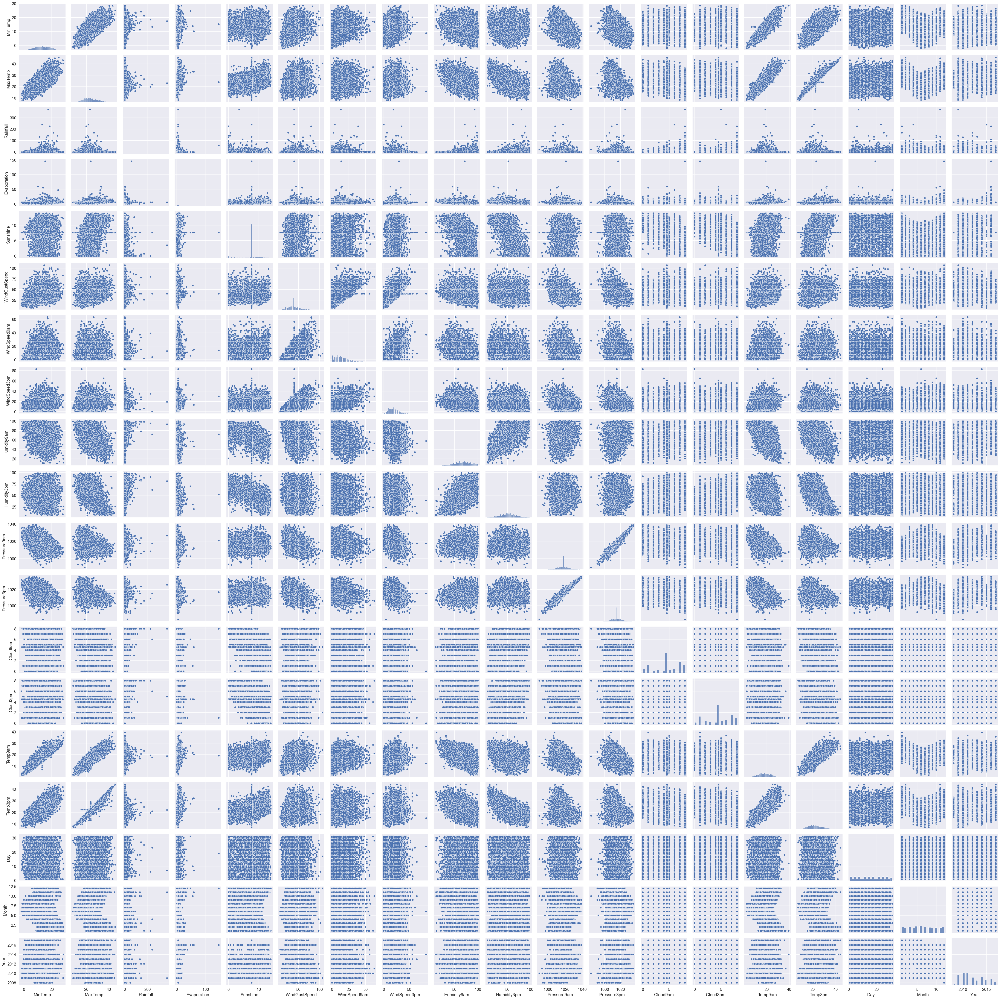

In [28]:
sns.pairplot(rf)

# STATISTICAL SUMMARY-

In [29]:
rf.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934,15.741958,6.442136,2012.102433
std,5.379488,6.114516,10.309308,3.852004,2.825451,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849,8.787354,3.437994,2.473137
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,8.000000,3.000000,2010.000000
50%,13.200000,23.300000,0.000000,5.389395,7.632205,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000,16.000000,6.000000,2011.000000
75%,17.300000,28.000000,1.400000,5.389395,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,23.000000,9.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,31.000000,12.000000,2017.000000


# LabelEncoder

In [30]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()  

In [31]:
for i in rf.columns:
    if rf[i].dtypes == "object":
        rf[i] = le.fit_transform(rf[i].values.reshape(-1,1))
        

In [32]:
rf.head() 

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.6,5.389395,7.632205,13,44.0,13,14,...,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,0.0,5.389395,7.632205,14,44.0,6,15,...,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,0.0,5.389395,7.632205,15,46.0,13,15,...,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,9,0,...,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.0,5.389395,7.632205,13,41.0,1,7,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008


# Check Correlation of Dataset After Label Encoding

<Axes: >

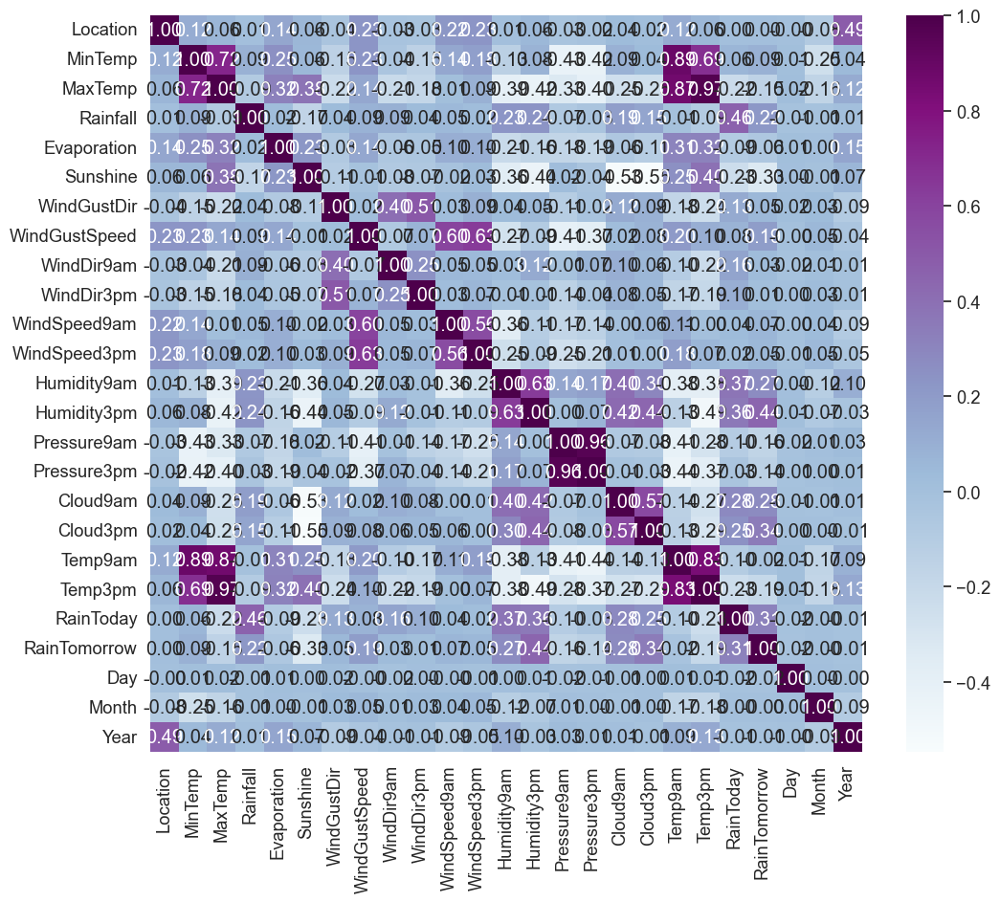

In [33]:
#Plotting the correlation of columns
plt.figure(figsize=[12,10])
sns.heatmap(rf.corr(),annot = True, fmt = '0.2f',cmap='BuPu')

In [34]:
print(rf.corr()['RainTomorrow'].drop('RainTomorrow').sort_values(ascending = False))

Humidity3pm      0.444808
Cloud3pm         0.344369
RainToday        0.312929
Cloud9am         0.278943
Humidity9am      0.271222
Rainfall         0.220021
WindGustSpeed    0.190127
MinTemp          0.092942
WindSpeed9am     0.068285
WindSpeed3pm     0.053568
WindGustDir      0.051832
WindDir9am       0.032860
WindDir3pm       0.008918
Location         0.002824
Month           -0.001243
Year            -0.011066
Day             -0.015461
Temp9am         -0.023211
Evaporation     -0.059012
Pressure3pm     -0.135242
MaxTemp         -0.152886
Pressure9am     -0.163985
Temp3pm         -0.193805
Sunshine        -0.327731
Name: RainTomorrow, dtype: float64


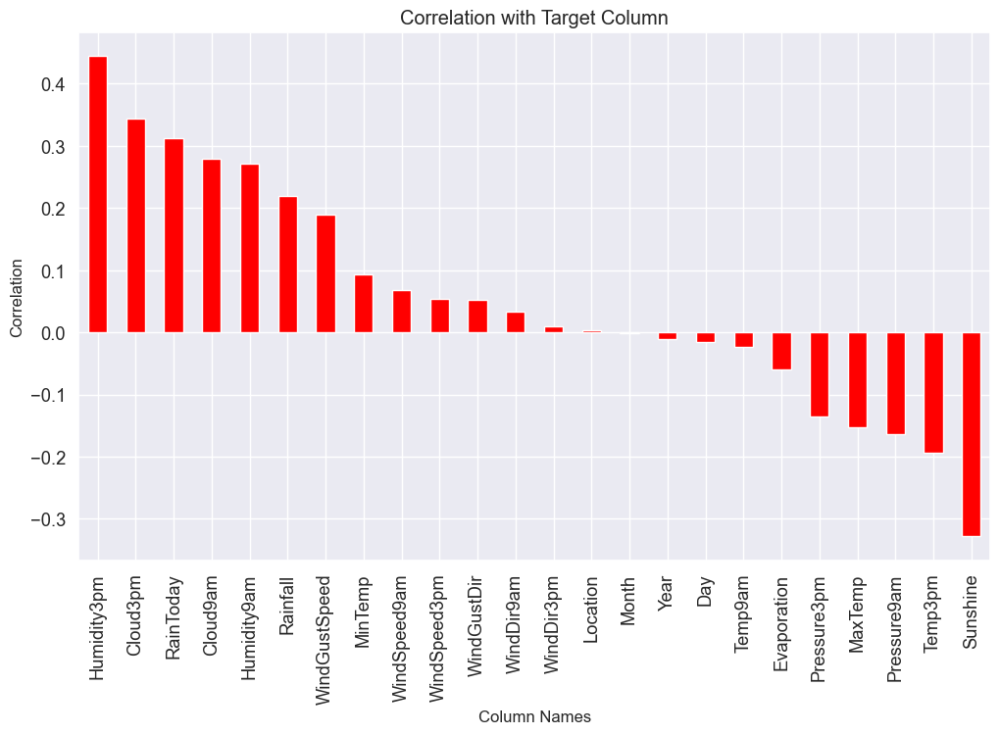

In [35]:
#Considering 'RainTomorrow' as Target Variable
plt.figure(figsize = [12,7])
rf.corr()['RainTomorrow'].sort_values(ascending= False).drop('RainTomorrow').plot(kind = 'bar', color ='red')
plt.xlabel('Column Names', fontsize = 12)
plt.ylabel('Correlation', fontsize = 12)
plt.title('Correlation with Target Column')
plt.show()

The columns 'Month', 'Year', 'Day', 'Temp9am', 'Evaporation', 'Pressure3pm', 'MaxTemp', 'Pressure9am', 'Temp3pm' and 'Sunshine'(Highest) are having negative correlation to the target variable 'RainTomorrow'. Rest of the columns are having positive correlation to the target variable 'RainTomorrow'.

RainToday        0.461106
Humidity3pm      0.235444
Humidity9am      0.228800
RainTomorrow     0.220021
Cloud9am         0.185444
Cloud3pm         0.150760
WindDir9am       0.093821
MinTemp          0.087684
WindGustSpeed    0.086000
WindSpeed9am     0.050631
WindGustDir      0.038812
WindDir3pm       0.038560
WindSpeed3pm     0.024791
Evaporation      0.023517
Location         0.007693
Year             0.006435
Temp9am         -0.007083
Month           -0.012244
Day             -0.013760
Pressure3pm     -0.033649
Pressure9am     -0.072668
MaxTemp         -0.087451
Temp3pm         -0.090687
Sunshine        -0.169432
Name: Rainfall, dtype: float64


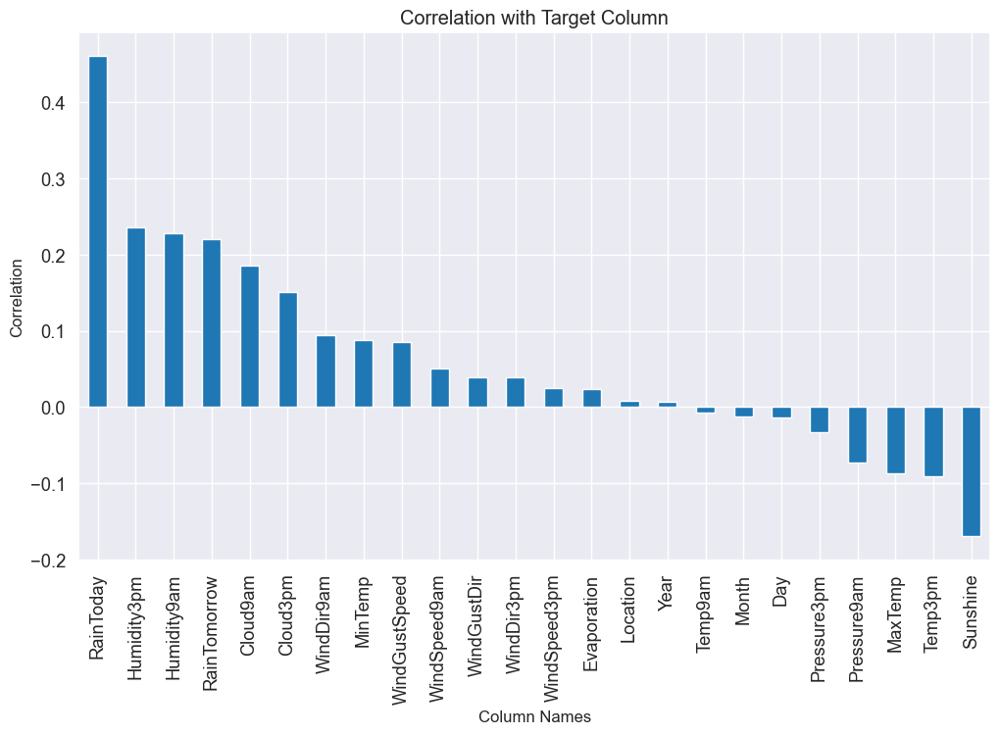

In [36]:
#Considering 'Rainfall' as the Target Variable.
print(rf.corr()['Rainfall'].drop('Rainfall').sort_values(ascending = False))
plt.figure(figsize = [12,7])
rf.corr()['Rainfall'].sort_values(ascending= False).drop('Rainfall').plot(kind = 'bar', color ='tab:blue')
plt.xlabel('Column Names', fontsize = 12)
plt.ylabel('Correlation', fontsize = 12)
plt.title('Correlation with Target Column')
plt.show()

We will be removing the location, month,day and year column as they have negligible correlation with RainTomorrow and rainfall

In [37]:
rf.drop(['Location','Day','Month','Year'],axis=1,inplace=True)

# Checking and Removing skewness


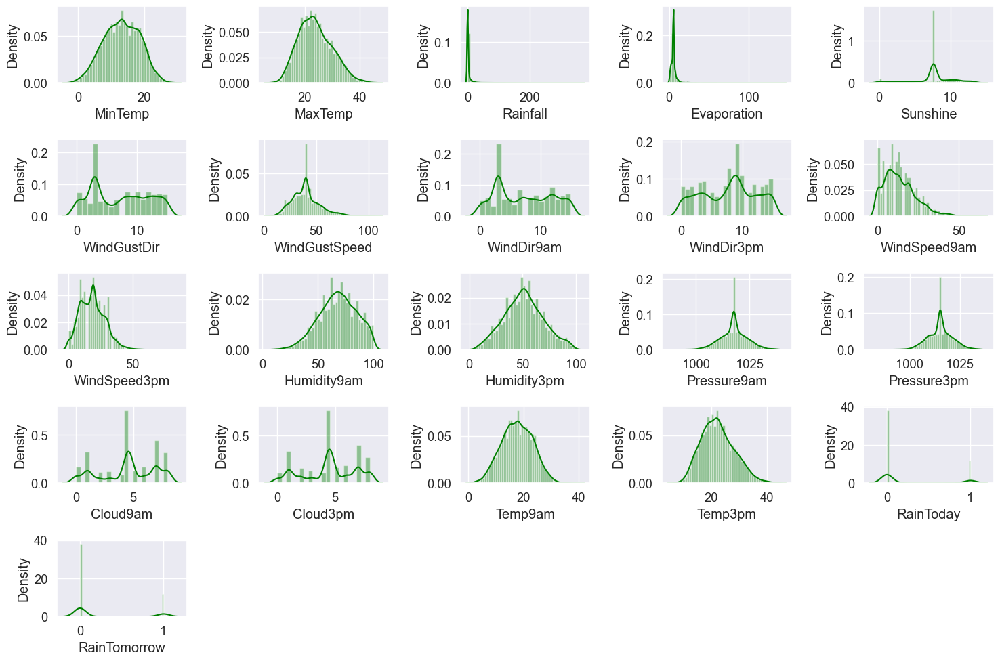

In [38]:
plt.figure(figsize=(15,10))
plot=1
for col in rf.columns:
    if plot<=25:
        plt.subplot(5,5,plot)
        sns.distplot(rf[col],color='green')
        plt.xlabel(col)
        plot=plot+1
plt.tight_layout()

Skewness is present in most of the variable data.Rainfall and evaporation is extremely skewed to right.

In [39]:
rf.skew().sort_values(ascending=False)

Evaporation      14.023948
Rainfall         13.218403
RainToday         1.242362
RainTomorrow      1.241588
WindSpeed9am      0.960591
WindGustSpeed     0.757000
WindSpeed3pm      0.494217
Temp3pm           0.397331
MaxTemp           0.380654
WindDir9am        0.172792
WindGustDir       0.119640
Humidity3pm       0.118281
Pressure3pm      -0.010214
Temp9am          -0.014748
Pressure9am      -0.024082
MinTemp          -0.089989
WindDir3pm       -0.119847
Humidity9am      -0.256743
Cloud3pm         -0.276294
Cloud9am         -0.366503
Sunshine         -0.716525
dtype: float64

The columns 'Evaporation', 'Rainfall', 'RainToday', 'RainTomorrow', 'WindSpeed9am','WindGustSpeed'and 'Sunshine' are having high skewness in the data distribution.
The columns 'RainToday' and 'RainTomorrow' are categorical in nature. So the skewness of these columns are irrelevant.

DATA CLEANING - (REMOVING SKEWNESS FROM THE DATA )

# Splitting the datasets

In [40]:
#1) PREDICTING 'RAIN TOMORROW' AS TARGET VARIABLE 
#Splitting the data into 'x' and 'y' labels-

x=rf.drop('RainTomorrow',axis=1)
y=rf['RainTomorrow']

print(x.shape)
print(y.shape)
z = x.columns

(8425, 20)
(8425,)


0    6434
1    1991
Name: RainTomorrow, dtype: int64


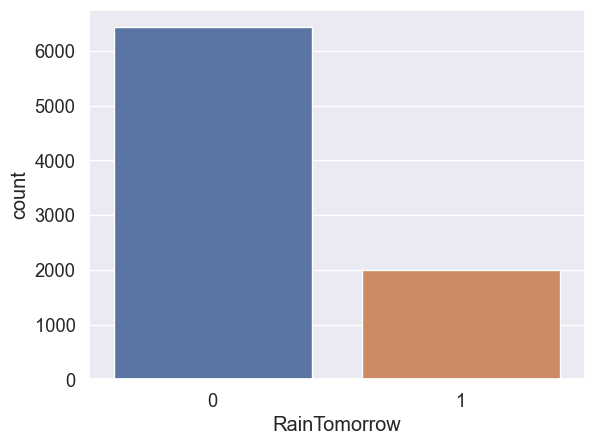

In [41]:
sns.countplot(x=y)
print(y.value_counts())

The data is not balanced. There is extreme imbalance present in the data. So we can balance the data using SMOTE technique .

# Using SMOTE to balance the categorical data


0    6434
1    6434
Name: RainTomorrow, dtype: int64


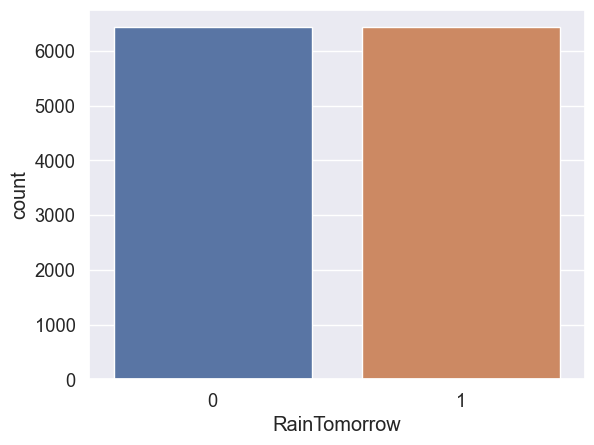

In [42]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
x,y=sm.fit_resample(x,y)
sns.countplot(x=y)
print(y.value_counts())

In [43]:
z = x.columns
print(x.shape)
print(y.shape)

(12868, 20)
(12868,)


# Scaling the data using standardscaler


In [121]:
#Scaling the data using standardscaler
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

x = sc.fit_transform(x)
x = pd.DataFrame(x,columns = z)
x

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,-0.006768,-0.041427,-0.343510,0.335102,0.097447,1.272413,0.305639,1.295724,1.482612,0.730631,0.559816,-0.004410,-1.832697,-1.574055,-1.306513,1.495699,-0.358079,-0.126178,0.034636,-0.623382
1,-1.156694,0.338315,-0.751870,0.335102,0.097447,1.494226,0.305639,-0.279820,1.718313,-1.131967,0.350603,-1.663828,-1.674330,-1.089628,-1.188486,-0.350214,-0.358079,-0.070160,0.475040,-0.623382
2,-0.102595,0.441881,-0.751870,0.335102,0.097447,1.716038,0.441002,1.295724,1.718313,0.645514,0.769030,-2.032588,-1.410386,-1.590760,-1.036737,-0.350214,-1.302465,0.639396,0.281262,-0.623382
3,-0.811716,0.838884,-0.751870,0.335102,0.097447,-0.723901,-1.387919,0.395413,-1.817199,-0.175365,-1.009284,-1.602369,-2.149431,0.079679,-0.345434,-0.350214,-0.358079,0.097892,0.862596,-0.623382
4,0.779015,1.581107,-0.103378,0.335102,0.097447,1.272413,0.090831,-1.405208,-0.167293,-0.697157,0.141390,0.671649,-1.252019,-1.056219,-1.491984,0.878104,1.548239,0.041875,1.426313,-0.623382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12523,1.274385,1.495705,0.575547,-0.375320,1.152559,-0.945714,0.523139,-0.955053,-0.638695,1.222475,0.514774,-1.257723,-0.510955,-0.106960,-0.241215,-1.549692,-0.421734,1.343504,1.056799,-0.623382
12524,0.109419,-0.229318,1.819444,0.129777,0.276124,0.606975,-0.219903,0.620491,0.539809,0.953662,0.077478,-0.383439,0.211329,1.611775,1.798608,-1.321538,-0.003796,0.283640,-0.156111,1.604152
12525,-1.767937,-1.703257,0.268868,0.216359,0.097447,1.272413,-1.320506,-0.504898,1.246912,-0.745472,-0.518487,1.082928,0.646393,0.766242,0.980440,0.405178,-1.000590,-1.812576,-1.635685,-0.623382
12526,-0.020134,-0.888076,-0.641771,0.335102,0.097447,-1.167526,0.008064,0.170335,-0.167293,-1.027202,-1.361179,0.585463,1.918759,0.006747,-0.152848,1.017268,1.548239,-0.336371,-1.223402,-0.623382


# Removing skewness

In [45]:
#We can set the skewness standard limit as +/-0.5.
x.skew().sort_values(ascending=False)[np.abs(x.skew())>0.5]

Evaporation      13.638781
Rainfall         10.362873
RainToday         0.987404
WindSpeed9am      0.897481
WindGustSpeed     0.668240
Cloud3pm         -0.507661
Cloud9am         -0.567115
Sunshine         -0.631894
dtype: float64

In [46]:
from sklearn.preprocessing import power_transform
skewed = ['Evaporation','Rainfall','RainToday','WindSpeed9am','WindGustSpeed','Cloud3pm','Cloud9am','Sunshine']
for col in skewed:
    x[col]=power_transform((x[col].values.reshape(-1,1)))

In [47]:
#We can set the skewness standard limit as +/-0.5.
x.skew().sort_values(ascending=False)

RainToday        0.987404
Rainfall         0.955095
Temp3pm          0.458705
MaxTemp          0.436766
WindSpeed3pm     0.403669
WindDir9am       0.187468
Sunshine         0.146181
WindGustDir      0.102089
WindSpeed9am     0.062813
Temp9am          0.021542
WindGustSpeed   -0.013137
Humidity3pm     -0.039091
Pressure3pm     -0.039671
Pressure9am     -0.053698
Evaporation     -0.057901
Cloud3pm        -0.082116
Cloud9am        -0.093829
WindDir3pm      -0.113362
MinTemp         -0.114666
Humidity9am     -0.413210
dtype: float64

# Cheking and removing outliers

In [48]:
from scipy.stats import zscore
# Removing outliers using zscore and keeping threshold as 3 .
z_score = np.abs(zscore(x))
df = x[(z_score < 3).all(axis = 1)]
df['RainTomorrow'] = y
df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,-0.014203,-0.059586,-0.339117,0.285517,0.09066,1.268334,0.287209,1.298621,1.477788,0.715277,...,0.013264,-1.789408,-1.494418,-1.232739,1.500135,-0.350577,-0.137967,0.014216,-0.621562,0
1,-1.159787,0.309098,-0.747582,0.285517,0.09066,1.489938,0.287209,-0.276285,1.713090,-1.140849,...,-1.616692,-1.633090,-1.030016,-1.119862,-0.344183,-0.350577,-0.082816,0.441928,-0.621562,0
2,-0.109668,0.409648,-0.747582,0.285517,0.09066,1.711542,0.421153,1.298621,1.713090,0.630455,...,-1.978904,-1.372559,-1.510432,-0.974733,-0.344183,-1.292566,0.615766,0.253735,-0.621562,0
3,-0.816112,0.795091,-0.747582,0.285517,0.09066,-0.726103,-1.388598,0.398675,-1.816442,-0.187571,...,-1.556323,-2.102045,0.090955,-0.313593,-0.344183,-0.350577,0.082638,0.818316,-0.621562,0
4,0.768614,1.515700,-0.098924,0.285517,0.09066,1.268334,0.074652,-1.401218,-0.169327,-0.707551,...,0.677320,-1.216241,-0.997988,-1.410118,0.883074,1.550901,0.027487,1.365788,-0.621562,0


In [49]:
df.shape

(12528, 21)

In [50]:
x.shape

(12868, 20)

In [51]:
data_loss = (x.shape[0]-df.shape[0])/x.shape[0]*100
print('loss of data in % :',data_loss)

loss of data in % : 2.6422132421510724


In [53]:
x = df.drop('RainTomorrow',axis = 1)
y= df['RainTomorrow']
print(x.shape)
print(y.shape)

(12528, 20)
(12528,)


# Checking multicollinearity using Variance Inflation Factor

In [54]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def vif(x):
    vif = pd.DataFrame()
    vif['Column Name'] = x.columns
    vif['VIF Factor'] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return(vif.sort_values(by ='VIF Factor', ascending = False))
vif(x)

,Column Name,VIF Factor
18,Temp3pm,31.465441
1,MaxTemp,23.566921
13,Pressure9am,18.667673
17,Temp9am,18.247987
14,Pressure3pm,17.620379
0,MinTemp,8.926018
12,Humidity3pm,6.040405
2,Rainfall,4.284913
11,Humidity9am,4.152885
19,RainToday,3.742032


There is high multicollinearity in the dataset among the following columns: 'Temp3pm', 'Pressure9am', 'Temp9am', and 'MaxTemp'.

In [55]:
X = x.drop(['Temp3pm','Pressure9am','Temp9am','MaxTemp'], axis = 1)
vif(X)

,Column Name,VIF Factor
1,Rainfall,4.226090
15,RainToday,3.736050
10,Humidity9am,2.563906
5,WindGustSpeed,2.228036
11,Humidity3pm,2.226465
9,WindSpeed3pm,2.031238
8,WindSpeed9am,1.998588
14,Cloud3pm,1.953310
13,Cloud9am,1.942127
3,Sunshine,1.902259


# Building ML Model

In [56]:
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier

from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_curve,roc_auc_score

In [57]:
def random_st_cls(model):
    max_score = 0
    max_rs = 0
    print('\n',model)
    for i in range(1,50):
        x_train, x_test,y_train,y_test= train_test_split(x,y,test_size = 0.30, random_state = i)
        model.fit(x_train,y_train)
        pred_test = model.predict(x_test)
        score = accuracy_score(y_test,pred_test)
        if score > max_score:
            max_score = score
            max_rs = i
    print("At random state ", max_rs, 'the model is having accuracy score of ', max_score)
    return max_rs

In [58]:
def model_fit_cls(model, rs):
    x_train, x_test,y_train,y_test= train_test_split(x,y,test_size = 0.30, random_state = rs)
    model.fit(x_train,y_train)
    pred_test = model.predict(x_test)
    cv_score = cross_val_score(model,x,y, cv = 5)
    cv_mean = cv_score.mean()
    print(f" Accuracy score is: {accuracy_score(y_test,pred_test)*100:.2f}")
    print ('\n','Confusion matrix:','\n',confusion_matrix(y_test,pred_test))
    print ('\n','Classification Report:','\n',classification_report(y_test,pred_test))
    print("The cv score is ", cv_mean, "and the accuracy score  is ",accuracy_score(y_test,pred_test))
    print(f'\n Difference between accuracy score and cross val score {(accuracy_score(y_test,pred_test)-cv_mean)*100:.2f}')
    print("-"*50)

In [59]:
def model_cls(m):
    m_rs = random_st_cls(m)
    model_fit_cls(m,m_rs)

In [60]:
Model_classify = [LogisticRegression(),RandomForestClassifier(), KNeighborsClassifier(),DecisionTreeClassifier(),GradientBoostingClassifier(),AdaBoostClassifier(),SVC(),ExtraTreesClassifier(),XGBClassifier()]

In [61]:
for i in Model_classify:
    model_cls(i)


 LogisticRegression()
At random state  8 the model is having accuracy score of  0.8002128225591912
 Accuracy score is: 80.02

 Confusion matrix: 
 [[1488  379]
 [ 372 1520]]

 Classification Report: 
               precision    recall  f1-score   support

           0       0.80      0.80      0.80      1867
           1       0.80      0.80      0.80      1892

    accuracy                           0.80      3759
   macro avg       0.80      0.80      0.80      3759
weighted avg       0.80      0.80      0.80      3759

The cv score is  0.7587879309218752 and the accuracy score  is  0.8002128225591912

 Difference between accuracy score and cross val score 4.14
--------------------------------------------------

 RandomForestClassifier()
At random state  30 the model is having accuracy score of  0.9356211758446396
 Accuracy score is: 93.24

 Confusion matrix: 
 [[1725  142]
 [ 112 1780]]

 Classification Report: 
               precision    recall  f1-score   support

           0  

ExtraTreesClassifier is the best. model with 94.5 % accuracy

# Hyper Parameter tuning

In [62]:
from sklearn.model_selection import GridSearchCV
parameters = {'n_estimators' : [100,150,200],
             'criterion': ['gini', 'entropy', 'log_loss'],
             'min_samples_split': [1,2,3],
             'max_features':['sqrt','log2',None]}

grid = GridSearchCV(estimator = ExtraTreesClassifier(),param_grid=parameters, cv = 10,n_jobs=-1)

In [63]:
grid.fit(x,y)

GridSearchCV(cv=10, estimator=ExtraTreesClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_features': ['sqrt', 'log2', None],
                         'min_samples_split': [1, 2, 3],
                         'n_estimators': [100, 150, 200]})

In [64]:
grid.best_score_

0.9213003169390268

In [65]:
grid.best_params_

{'criterion': 'gini',
 'max_features': 'sqrt',
 'min_samples_split': 2,
 'n_estimators': 150}

In [66]:
final_model_cls= ExtraTreesClassifier(n_estimators = 150,criterion = 'gini',min_samples_split = 2,max_features = 'sqrt')
x_train, x_test,y_train,y_test = train_test_split(x,y,test_size = 0.20, random_state = 45)
final_model_cls.fit(x_train, y_train)
pred_etc = final_model_cls.predict(x_test)
print("Accuracy Score is ",accuracy_score(y_test,pred_etc))
print(classification_report(y_test,pred_etc))
cv_score = cross_val_score(final_model_cls,x,y, cv = 10)
cv_mean =cv_score.mean()
print('CV score is ', cv_mean)

Accuracy Score is  0.9497206703910615
              precision    recall  f1-score   support

           0       0.95      0.94      0.95      1220
           1       0.95      0.96      0.95      1286

    accuracy                           0.95      2506
   macro avg       0.95      0.95      0.95      2506
weighted avg       0.95      0.95      0.95      2506

CV score is  0.9185865105854575


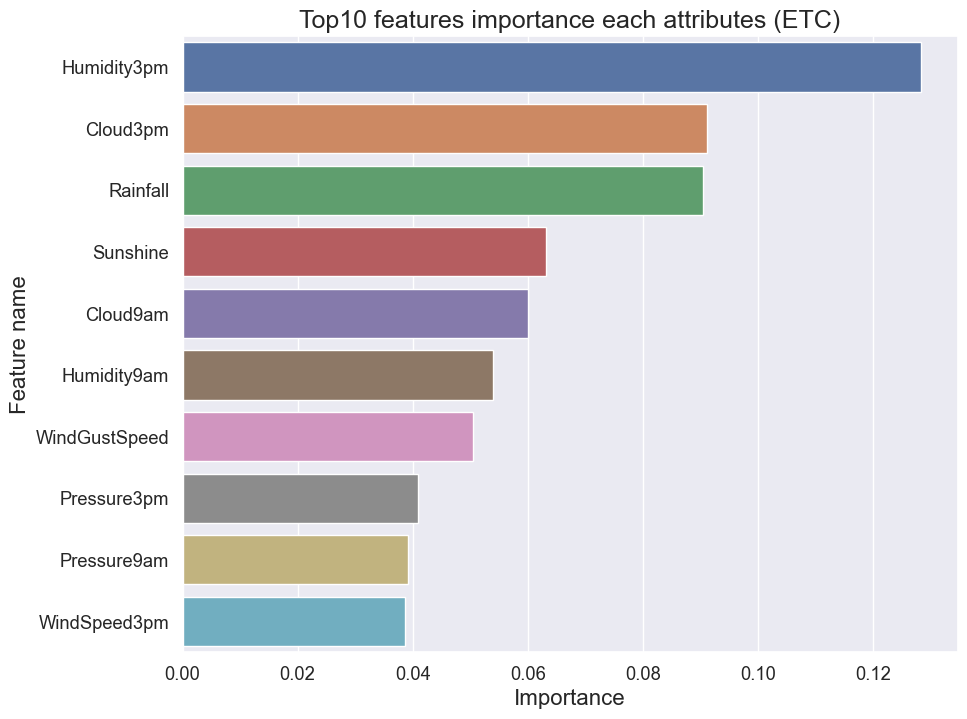

In [67]:
imp_id=pd.DataFrame({"Feature Name":x_train.columns,"Importance":final_model_cls.feature_importances_})
fi=imp_id.sort_values(by="Importance",ascending=False)
fi2=fi.head(10)
plt.figure(figsize=(10,8))
sns.barplot(data=fi2,x="Importance",y="Feature Name")
plt.title('Top10 features importance each attributes (ETC)',fontsize=18)
plt.xlabel('Importance',fontsize=16)
plt.ylabel('Feature name', fontsize=16)
plt.show()

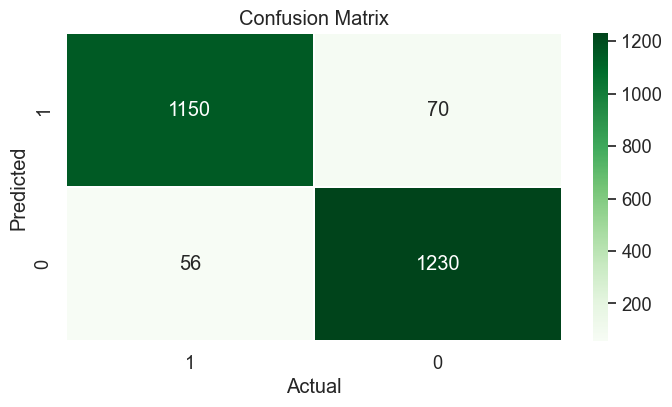

In [68]:
cm = confusion_matrix(y_test, pred_etc)
x_labels = ["1","0"]
y_labels = ["1","0"]
f, ax = plt.subplots(figsize =(8,4))
sns.heatmap(cm, annot = True, linewidths=0.2, fmt = ".0f", ax=ax, cmap="Greens", xticklabels=x_labels, yticklabels=y_labels)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title('Confusion Matrix')
plt.show()

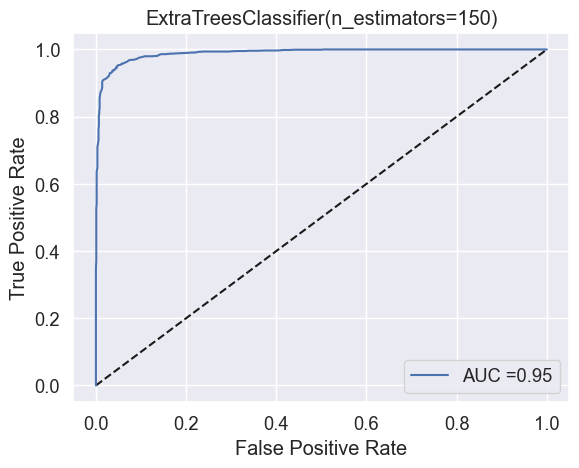

In [69]:
def auc_roc(model):
    y_pred_prob = model.predict_proba(x_test)[:,1]
    fpr,tpr,thresholds = roc_curve(y_test,y_pred_prob)
    auc_score = roc_auc_score(y_test, model.predict(x_test))
    plt.plot([0,1],[0,1],'k--')
    plt.plot(fpr, tpr, label = 'AUC ='+str(round(auc_score,2)))
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc = 'lower right')
    plt.title(model)
    plt.show()
auc_roc(final_model_cls)

In [70]:
import pickle

filename = 'Rainfall forecasting RainTomorrow model .pkl'
pickle.dump(final_model_cls,open(filename,'wb'))

In [71]:
original = np.array(y_test)
predicted = np.round(np.array(final_model_cls.predict(x_test)),0)
tom_prediction = pd.DataFrame({'Rain Tomorrow(Original)':original,'Rain Tomorrow(Predicted)':predicted})
tom_prediction.sample(10)

,Rain Tomorrow(Original),Rain Tomorrow(Predicted)
1718,1,1
1463,0,0
354,1,1
637,0,0
1933,0,0
870,1,1
2493,1,0
2076,1,1
2101,1,1
0,1,1


# 2) PREDICTING 'RAINFALL' AS TARGET VARIABLE-

In [95]:
#Splitting the data into 'x' and 'y' labels-
X=rf.drop('Rainfall',axis=1)
Y=rf['Rainfall']
Z = X.columns

print(X.shape)
print(Y.shape)

(8425, 20)
(8425,)


# Scaling the data using standardscaler


In [96]:
#Scaling the data using standardscaler
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

X = sc.fit_transform(X)
X = pd.DataFrame(X,columns = z)
X

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,0.038425,-1.570089e-01,-2.305893e-16,3.143679e-16,1.229643,0.277710,1.249535,1.397222,0.607461,0.563297,0.189439,-1.597406,-1.584003,-1.308665,1.413459,3.862851e-16,-0.153712,-0.108138,-0.556099,-0.556282
1,-1.076989,2.028121e-01,-2.305893e-16,3.143679e-16,1.442303,0.277710,-0.276260,1.622961,-0.972321,0.357200,-1.420268,-1.433568,-1.121880,-1.196072,0.000000,3.862851e-16,-0.100217,0.312348,-0.556099,-0.556282
2,-0.054526,3.009450e-01,-2.305893e-16,3.143679e-16,1.654964,0.422897,1.249535,1.622961,0.508725,0.769394,-1.777981,-1.160505,-1.599939,-1.051309,0.000000,-1.088680e+00,0.577390,0.127334,-0.556099,-0.556282
3,-0.742365,6.771214e-01,-2.305893e-16,3.143679e-16,-0.684299,-1.174166,0.377652,-1.763120,-0.281166,-0.982428,-1.360650,-1.925081,-0.006411,-0.391836,0.000000,3.862851e-16,0.060269,0.682376,-0.556099,-0.556282
4,0.800625,1.380408e+00,-2.305893e-16,3.143679e-16,1.229643,0.059928,-1.366114,-0.182949,-0.676112,0.151104,0.845246,-0.996668,-1.090010,-1.485596,1.001777,1.520830e+00,0.006773,1.220599,-0.556099,-0.556282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,-1.932140,-7.523137e-02,-2.305893e-16,3.143679e-16,-1.534940,-0.666009,0.377652,-1.537381,-0.083694,-0.776331,-1.002937,-1.488181,1.109058,0.814518,0.000000,3.862851e-16,-1.366273,-0.007221,-0.556099,-0.556282
8421,-1.783418,2.355231e-01,-2.305893e-16,3.143679e-16,-0.258979,-1.319354,0.377652,-1.085904,-0.083694,-0.982428,-0.704843,-1.652018,0.933770,0.621501,0.000000,3.862851e-16,-1.223619,0.345987,-0.556099,-0.556282
8422,-1.448794,4.972110e-01,-2.305893e-16,3.143679e-16,-0.896959,-0.230447,0.377652,1.397222,-0.478639,-0.982428,-0.883699,-1.488181,0.535388,0.251553,0.000000,3.862851e-16,-0.938310,0.615099,-0.556099,-0.556282
8423,-1.002628,5.135665e-01,-2.305893e-16,3.143679e-16,0.379002,-0.883791,0.595623,-1.085904,-0.083694,-1.188525,-1.002937,-1.488181,0.280424,0.203299,-0.644950,-1.088680e+00,-0.474684,0.598279,-0.556099,-0.556282


# Removing the skewness

In [97]:
#We can set the skewness standard limit as +/-1.
X.skew().sort_values(ascending=False)[np.abs(X.skew())>0.5]

Rainfall       14.023948
Temp3pm         1.242362
RainToday       1.241588
WindDir3pm      0.960591
WindGustDir     0.757000
Evaporation    -0.716525
dtype: float64

In [98]:
skew_col= ['Evaporation','RainToday','WindSpeed9am','WindGustSpeed','Cloud3pm','Cloud9am','Sunshine']
for col in skew_col:
    X[col]=power_transform((X[col].values.reshape(-1,1)))

In [99]:
X.skew().sort_values(ascending=False)

Rainfall         14.023948
Temp3pm           1.242362
RainToday         1.241588
WindDir3pm        0.960591
WindGustDir       0.757000
Temp9am           0.397331
MaxTemp           0.380654
Humidity9am       0.118281
Evaporation       0.054201
WindGustSpeed     0.040558
WindSpeed9am      0.040136
Sunshine          0.034697
Cloud3pm          0.000620
Pressure9am      -0.010214
Humidity3pm      -0.024082
Cloud9am         -0.024778
MinTemp          -0.089989
WindDir9am       -0.119847
WindSpeed3pm     -0.256743
Pressure3pm      -0.366503
dtype: float64

# Removing the outliers

In [100]:
# Removing outliers using zscore and keeping threshold as 3 .
z_score = np.abs(zscore(X))
df2 = X[(z_score < 3).all(axis = 1)]
df2['Rainfall'] = Y
df2.head()   

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,0.038425,-0.157009,0.6,-0.105206,1.210844,0.277710,1.221504,1.397222,0.607461,0.630299,0.189439,-1.597406,-1.584003,-1.308665,1.413459,-0.080386,-0.157256,-0.108138,-0.556099,-0.556282
1,-1.076989,0.202812,0.0,-0.105206,1.402494,0.277710,-0.214951,1.622961,-0.972321,0.440853,-1.420268,-1.433568,-1.121880,-1.196072,0.000000,-0.080386,-0.103825,0.312348,-0.556099,-0.556282
2,-0.054526,0.300945,0.0,-0.105206,1.592066,0.422897,1.221504,1.622961,0.508725,0.813260,-1.777981,-1.160505,-1.599939,-1.051309,0.000000,-1.081650,0.575201,0.127334,-0.556099,-0.556282
3,-0.742365,0.677121,0.0,-0.105206,-0.664253,-1.174166,0.436642,-1.763120,-0.281166,-1.011078,-1.360650,-1.925081,-0.006411,-0.391836,0.000000,-0.080386,0.056632,0.682376,-0.556099,-0.556282
4,0.800625,1.380408,1.0,-0.105206,1.210844,0.059928,-1.436533,-0.182949,-0.676112,0.243641,0.845246,-0.996668,-1.090010,-1.485596,1.001777,1.649938,0.003118,1.220599,-0.556099,-0.556282


In [101]:
df2.shape

(8113, 20)

In [102]:
X.shape

(8425, 20)

In [103]:
data_loss = (X.shape[0]-df2.shape[0])/X.shape[0]*100
print('loss of data in % :',data_loss)

loss of data in % : 3.70326409495549


### By using the zscore method to remove outliers, we are losing only 3.70 % of the data.

In [104]:
X= df2.drop('Rainfall',axis = 1)
Y = df2['Rainfall']
print(X.shape)
print(Y.shape)

(8113, 19)
(8113,)


# Checking multicollinearity using Variance Inflation Factor

In [105]:
vif(X)

,Column Name,VIF Factor
16,Temp9am,32.610276
1,MaxTemp,26.087453
11,Humidity3pm,19.441508
12,Pressure9am,18.714679
15,Cloud3pm,16.817234
0,MinTemp,8.172794
10,Humidity9am,5.588408
9,WindSpeed3pm,3.776224
4,WindGustDir,2.312545
7,WindDir3pm,1.976741


In [106]:
X = X.drop(['Temp3pm','Pressure9am', 'Temp9am','MaxTemp'], axis =1).copy()
vif(X)

,Column Name,VIF Factor
13,Cloud3pm,8.997348
0,MinTemp,7.935650
8,WindSpeed3pm,2.736152
3,WindGustDir,2.287685
9,Humidity9am,2.258084
6,WindDir3pm,1.951858
11,Pressure3pm,1.900575
7,WindSpeed9am,1.884925
1,Evaporation,1.851241
12,Cloud9am,1.833348


In [107]:
X.shape

(8113, 15)

# building the ML mnodel

In [108]:
# Importing required libraries

from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from xgboost import XGBRegressor
import pickle
from sklearn import metrics
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.model_selection import cross_val_score

In [109]:
def random_st_reg(model):
    max_score = 0
    max_rs = 0
    print('\n',model)
    for i in range(1,50):
        x_train, x_test,y_train,y_test= train_test_split(X,Y,test_size = 0.20, random_state = i)
        model.fit(x_train,y_train)
        pred_test = model.predict(x_test)
        score = r2_score(y_test,pred_test)
        if score > max_score:
            max_score = score
            max_rs = i
    print("At random state ", max_rs, 'the model is having accuracy score of ', max_score)
    return max_rs

In [110]:
def model_fit_reg(model, rs):
    x_train, x_test,y_train,y_test= train_test_split(X,Y,test_size = 0.20, random_state = rs)
    model.fit(x_train,y_train)
    pred_test = model.predict(x_test)
    r2 = r2_score(y_test,pred_test)
    mse = mean_squared_error(y_test,pred_test)
    mae = mean_absolute_error(y_test,pred_test)
    cv_score = cross_val_score(model,X,Y, cv = 8)
    cv_mean = cv_score.mean()
    print("\n R2 score is ", r2)
    print("-"*50)
    print("Mean Sqaured Error is ",mse)
    print("-"*50)
    print("Mean Absolute Error is ",mae)
    print("-"*50)
    print("The cv score is ", cv_mean, "and the R2 score  is ",r2)
    print(f'\n Difference between accuracy score and cross val score {(r2-cv_mean)*100:.2f}')
    print("-"*50)


In [111]:
def model_reg(m):
    m_rs = random_st_reg(m)
    model_fit_reg(m,m_rs)

In [112]:
models = [LinearRegression(), KNeighborsRegressor(), SVR(), DecisionTreeRegressor(), RandomForestRegressor(n_estimators=100), AdaBoostRegressor(),GradientBoostingRegressor(), ExtraTreesRegressor(), XGBRegressor()]


In [113]:
for i in models:
    model_reg(i)


 LinearRegression()
At random state  5 the model is having accuracy score of  0.15806346259307602

 R2 score is  0.15806346259307602
--------------------------------------------------
Mean Sqaured Error is  44.35361574306988
--------------------------------------------------
Mean Absolute Error is  3.558821752345108
--------------------------------------------------
The cv score is  0.09846464905070892 and the R2 score  is  0.15806346259307602

 Difference between accuracy score and cross val score 5.96
--------------------------------------------------

 KNeighborsRegressor()
At random state  37 the model is having accuracy score of  0.29895321398962627

 R2 score is  0.29895321398962627
--------------------------------------------------
Mean Sqaured Error is  63.44484032576792
--------------------------------------------------
Mean Absolute Error is  3.107085497831832
--------------------------------------------------
The cv score is  0.11871942184926908 and the R2 score  is  0.2989

ExtraTreesRegressor is the best model with 64% accuracy

# HYPERPARAMETER TUNNING OF EXTRA TREE REGRESSOR

In [114]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
parameters = {'n_estimators':[100,125,150,200],
             'criterion': ['squared_error','absolute_error'],
             'max_features': [None,'sqrt','log2'],
             'max_depth':[10,20,30,None]}

grid = HalvingGridSearchCV(estimator = ExtraTreesRegressor(),param_grid=parameters, cv = 5)
grid.fit(X,Y)

HalvingGridSearchCV(estimator=ExtraTreesRegressor(),
                    param_grid={'criterion': ['squared_error',
                                              'absolute_error'],
                                'max_depth': [10, 20, 30, None],
                                'max_features': [None, 'sqrt', 'log2'],
                                'n_estimators': [100, 125, 150, 200]})

In [115]:
grid.best_score_

0.3445464578101859

In [116]:
grid.best_params_

{'criterion': 'absolute_error',
 'max_depth': 30,
 'max_features': 'sqrt',
 'n_estimators': 125}

In [117]:
final_model_reg= ExtraTreesRegressor(n_estimators = 125,criterion = 'absolute_error',max_depth = 30,max_features = 'sqrt')
x_train, x_test,y_train,y_test = train_test_split(X,Y,test_size = 0.20, random_state = 19)
final_model_reg.fit(x_train, y_train)
pred_reg= final_model_reg.predict(x_test)
print('R2 Score',r2_score(y_test,pred_reg))
print('Mean Squared Error',mean_squared_error(y_test,pred_reg))
print('Mean Absolute Error',mean_absolute_error(y_test,pred_reg))
cv_score = cross_val_score(final_model_reg,X,Y)
cv_mean =cv_score.mean()
print('CV score is ', cv_mean)

R2 Score 0.31907510794737737
Mean Squared Error 47.19486341266069
Mean Absolute Error 2.0445888293171124
CV score is  0.3525143857260158


In [118]:
import pickle

filename = 'Rainfall prediction model.pkl'
pickle.dump(final_model_reg,open(filename,'wb'))

In [119]:
original = np.array(y_test)
predicted = np.array(final_model_reg.predict(x_test))

predrainfal = pd.DataFrame({'Original Rainfall(mm)':original,'Predicted Rainfall(mm)':predicted})
predrainfal.sample(20)

,Original Rainfall(mm),Predicted Rainfall(mm)
595,0.0,0.000000
799,9.8,0.608000
1486,0.0,0.001600
1580,9.2,3.619342
740,1.2,7.799200
461,3.4,2.121789
472,0.0,0.000000
637,0.0,0.164800
382,0.0,0.144800
1067,0.0,0.000000


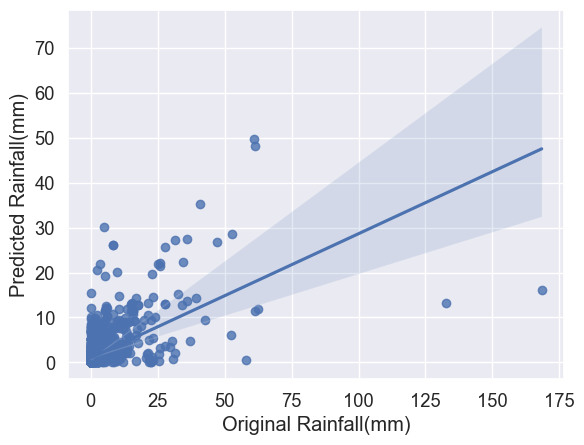

In [120]:
sns.regplot(x='Original Rainfall(mm)', y='Predicted Rainfall(mm)', data = predrainfal)
plt.show()